# Imágenes panoramicas con scikit-image

In [36]:
import os
import matplotlib.pyplot as plt
import skimage as ski
from skimage import transform
from skimage.feature import match_descriptors, ORB
from skimage.measure import ransac
from skimage.filters import gaussian
from skimage.transform import ProjectiveTransform
from skimage.exposure import histogram_matching
import numpy as np
import threading
from skimage.color import rgb2gray
import warnings

## Pasos generales

* Detectar puntos clave en las imágenes.
* Estimar la matriz de homografía.
* Aplicar la transformación.
* Post-procesamiento de la imagen

[]

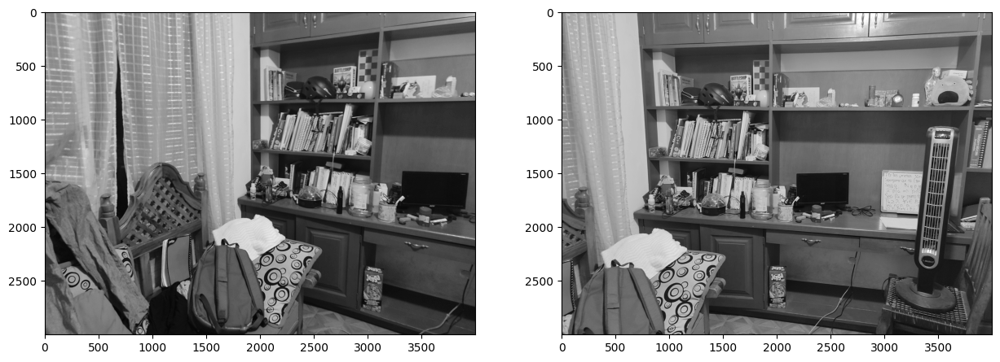

In [2]:
img1 = ski.io.imread(os.path.join("imagenes-prodimag/estudio","IMG_20240506_195904.jpg"),as_gray=True)
img2 = ski.io.imread(os.path.join("imagenes-prodimag/estudio","IMG_20240506_195907.jpg"),as_gray=True)

fig, ax = plt.subplots(1,2,figsize=(15, 8))
ax[0].imshow(img1,cmap="gray")
ax[1].imshow(img2,cmap="gray")
plt.plot()

## Histogram matching
Antes de realizar cualquier cosa, dado que son imagenes independientes, tienes distinda iluminación, brillo, colores etc, por lo cual realice un histogram matching antes de hacer la panorámica.

[]

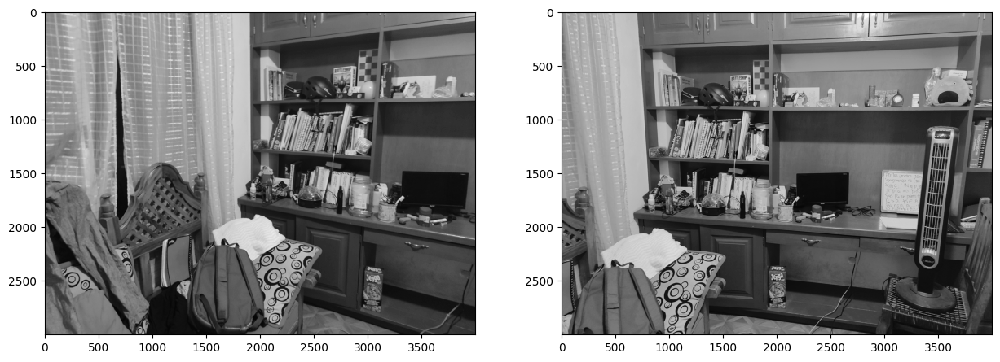

In [4]:
img2 = histogram_matching.match_histograms(img2,img1)
fig, ax = plt.subplots(1,2,figsize=(15, 8))
ax[0].imshow(img1,cmap="gray")
ax[1].imshow(img2,cmap="gray")
plt.plot()

## Obtención de características
Para la obtención de características utilice un algoritmo llamado ORB(Oriented FAST and Rotated BRIEF), algoritmo desarrollado en OpenCV lab.

C:\Users\PC\AppData\Local\Temp\ipykernel_14072\690723291.py:18: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(


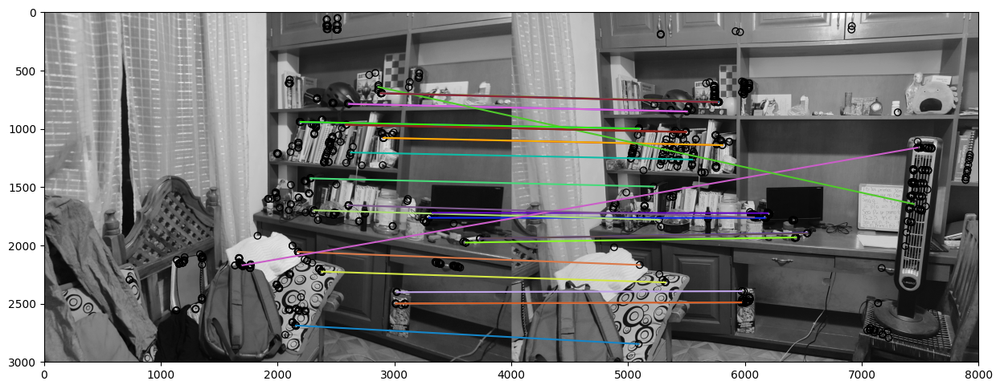

In [9]:
from skimage.feature import plot_matches
descriptor_extractor = ORB()

descriptor_extractor.detect_and_extract(img1)
keypoints1 = descriptor_extractor.keypoints.copy()
descriptors1 = descriptor_extractor.descriptors

descriptor_extractor.detect_and_extract(img2)
keypoints2 = descriptor_extractor.keypoints.copy()
descriptors2 = descriptor_extractor.descriptors

matches12 = match_descriptors(
            descriptors1, descriptors2, max_ratio=0.8, cross_check=True
)

fig, ax = plt.subplots(figsize=(15, 8))

plot_matches(
    ax,
    img1,
    img2,
    keypoints1,
    keypoints2,
    matches12
)

In [10]:
puntos_ref = keypoints1[matches12[:, 0]][:, ::-1]
puntos_obj = keypoints2[matches12[:, 1]][:, ::-1]

## Cálculo de la matriz de homografia.
Se denomina homografía a toda transformación proyectiva que determina una correspondencia entre dos figuras geométricas planas.

Usando el algoritmo RANSAC se calcula esta matriz.

[]

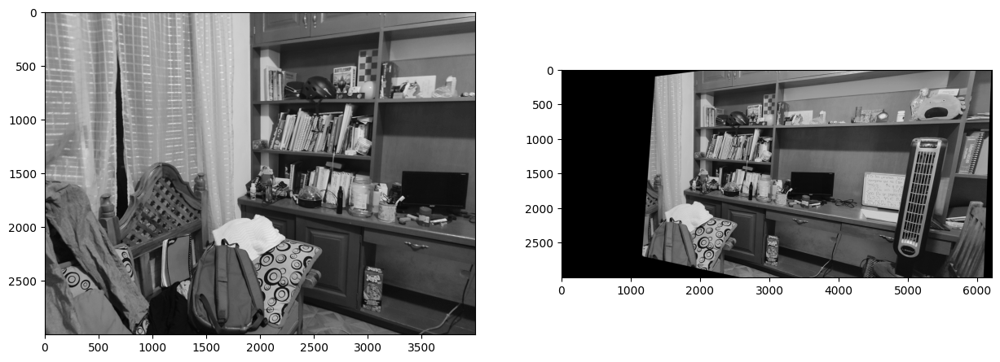

In [11]:
modelo_robusto, _ = ransac((puntos_obj, puntos_ref), ProjectiveTransform, min_samples=4, residual_threshold=2,max_trials=1000)

#Calculamos en donde quedarian las esquinas de la segunda imagen.
corners = np.array([[0, 0], [0, img2.shape[0]], [img2.shape[1], img2.shape[0]], [img2.shape[1], 0]])
corners_transformed = transform.matrix_transform(corners, modelo_robusto.params)
pano_width = max(np.max(corners_transformed[:, 0]), img1.shape[1])

#Hacemos la tranformacion de la segunda imagen
result = transform.warp(img2, modelo_robusto.inverse,mode='constant',output_shape=(img1.shape[0],int(pano_width)))

fig, ax = plt.subplots(1,2,figsize=(15, 8))
ax[0].imshow(img1,cmap="gray")
ax[1].imshow(result,cmap="gray")
plt.plot()

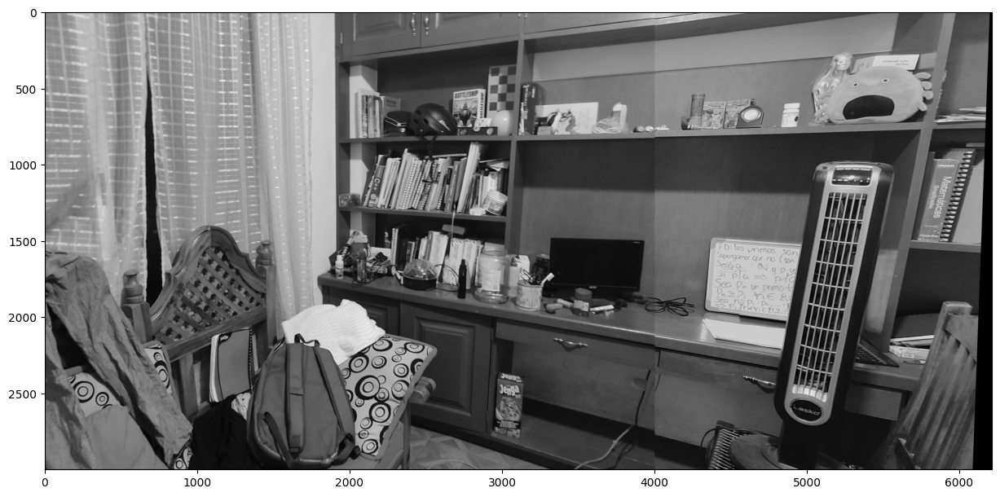

In [13]:
#Combinamos la imagen

result[:, :img1.shape[1]] = img1
fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(result,cmap="gray")
plt.show()

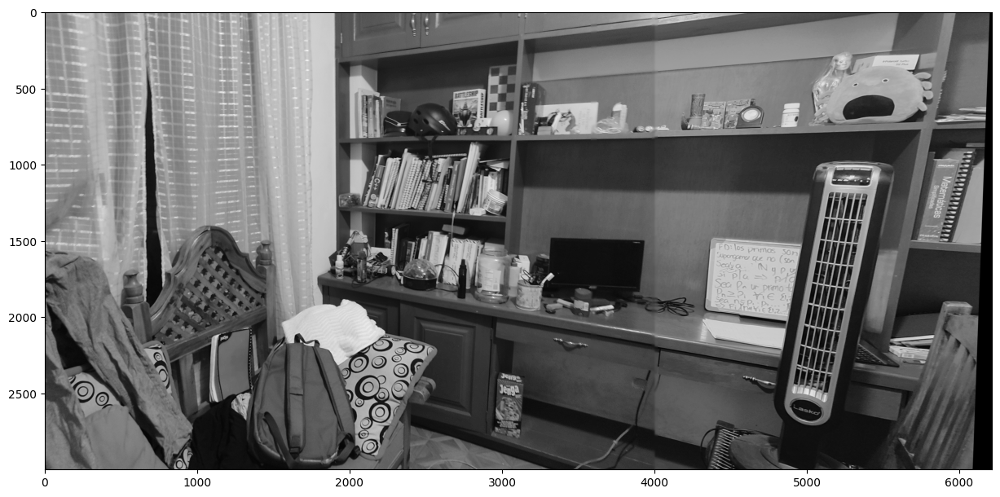

In [15]:
#Aplicamos algunos retoques...
result_c = result.copy()
result[:,img1.shape[1]-400:img1.shape[1]] = np.maximum(result[:,img1.shape[1]-400:img1.shape[1]],result_c[:,img1.shape[1]-400:img1.shape[1]])
result[:,img1.shape[1]-20:img1.shape[1]+20] = gaussian(result[:,img1.shape[1]-20:img1.shape[1]+20],sigma=5)
result[:,img1.shape[1]-420:img1.shape[1]-380] = gaussian(result[:,img1.shape[1]-420:img1.shape[1]-380],sigma=5)

fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(result,cmap="gray")
plt.show()

## Para no desperdiciar la imagen y dejarla asi decidi crear un filtro simple...

In [16]:
img_gray = result

[]

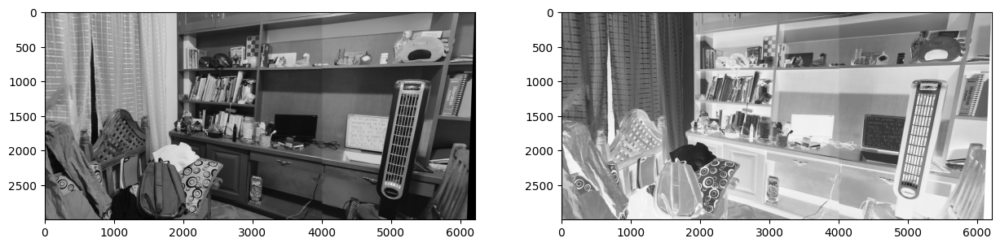

In [17]:
img_gray =  (img_gray * 255).astype(np.uint8)
img_inverted = np.invert(img_gray)

fig, ax = plt.subplots(1,2,figsize=(15, 8))
ax[0].imshow(img_gray,cmap="gray")
ax[1].imshow(img_inverted,cmap="gray")
plt.plot()

[]

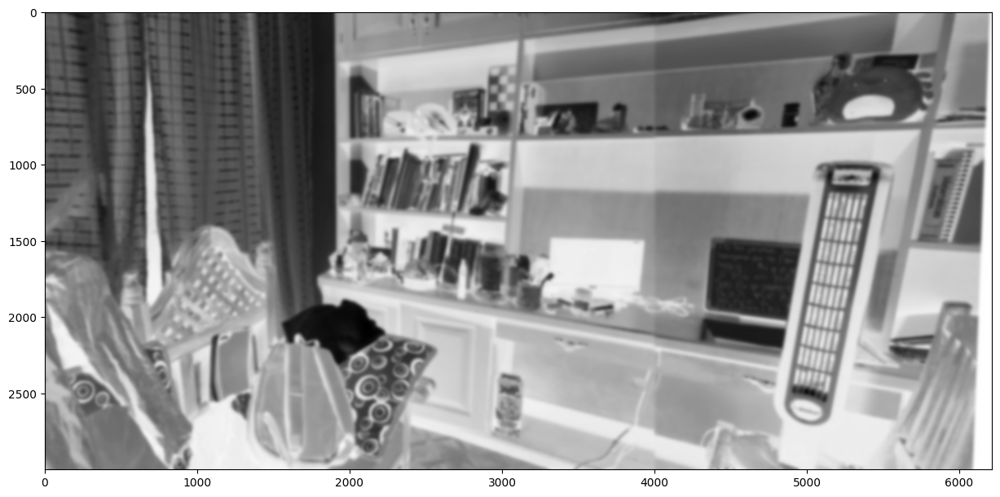

In [18]:
gaussian_ = gaussian(img_inverted,sigma=10)
gaussian_ = (gaussian_ * 255).astype(np.uint8)

fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(gaussian_,cmap="gray")
plt.plot()

C:\Users\PC\AppData\Local\Temp\ipykernel_14072\2183033073.py:2: RuntimeWarning: invalid value encountered in divide
  divided = (img_gray/inverted_gaussian)*255


[]

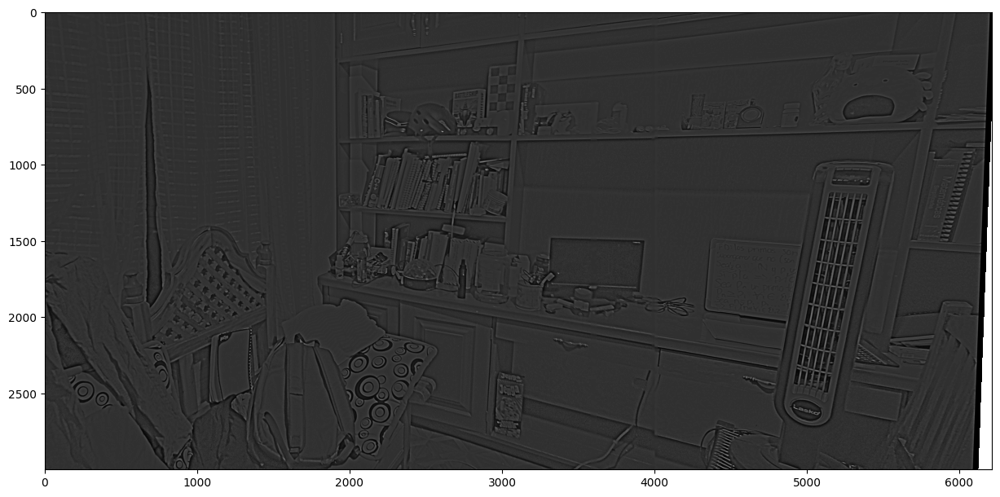

In [19]:
inverted_gaussian = np.invert(gaussian_)
divided = (img_gray/inverted_gaussian)*255

fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(divided,cmap="gray")
plt.plot()

[]

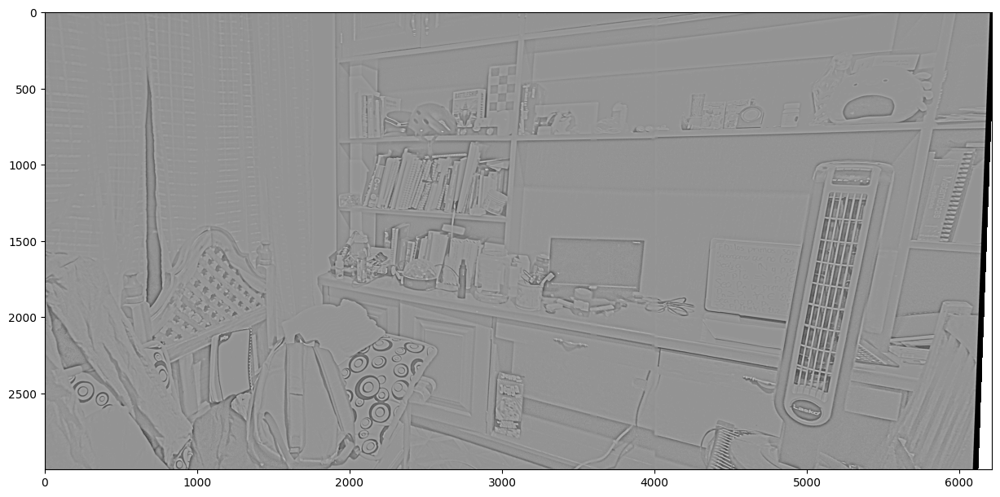

In [20]:
divided = divided**(1/3)

fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(divided,cmap="gray")
plt.plot()

[]

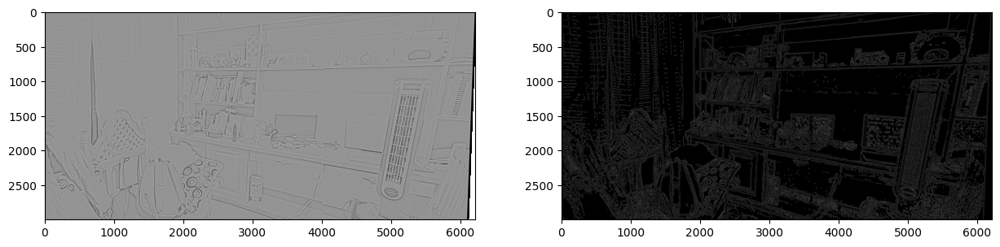

In [21]:
canny = ski.feature.canny(divided,sigma=3)

fig, ax = plt.subplots(1,2,figsize=(15, 8))
ax[0].imshow(divided,cmap="gray")
ax[1].imshow(canny,cmap="gray")
plt.plot()

[]

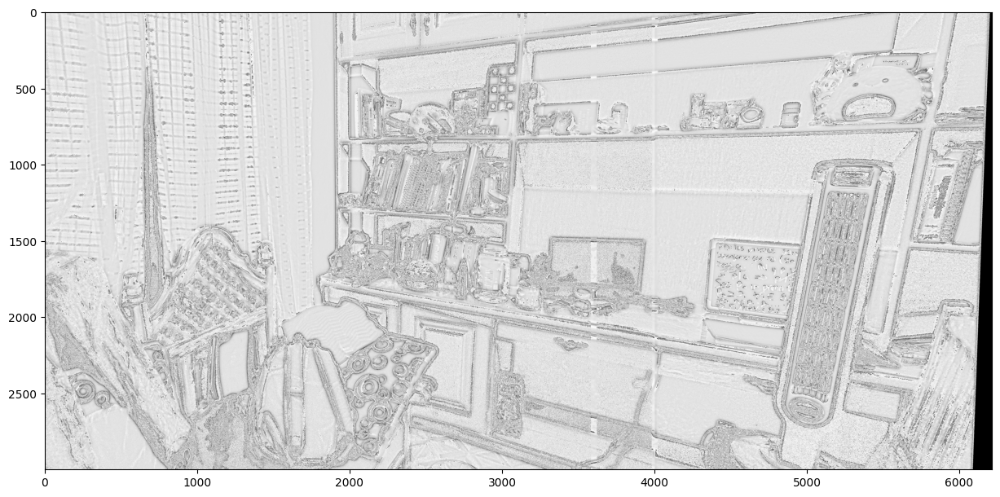

In [23]:
canny = (canny * 255).astype(np.uint8)
canny = np.invert(canny)

divided = (divided * 255).astype(np.uint8)

final = np.minimum(canny,divided**(1/3))

fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(final,cmap="gray")
plt.plot()

[]

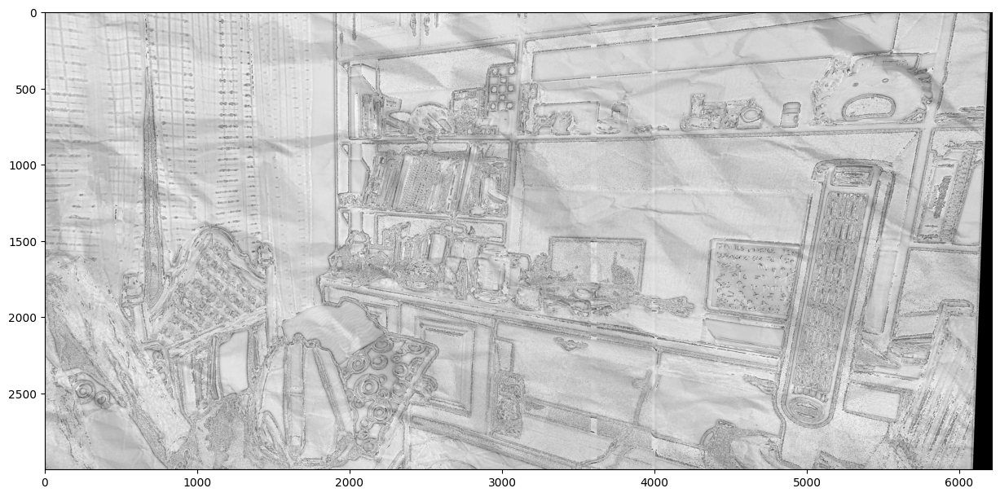

In [25]:
texture = ski.io.imread(os.path.join("imagenes-prodimag/","papel.jpg"),as_gray=True)
texture = ski.transform.resize(texture,final.shape)
texture = texture*0.5 + 0.5
final = final*texture

fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(final,cmap="gray")
plt.plot()

## Funciones comprimidas

### Panorámica

In [26]:
def fix(shape,result,result_c,cross_point):
    """
    Makes some adjustments to the image.

    Parameters
    -------------
    shape: tuple
        Shape of the left image
    result: 2Darray
        Image to be adjusted
    result_c: 2Darray
        Copy of result
    cross_point: int
        Width value where images begin to be combined.

    Returns
    -------------
        2Darray
        Adjusted image. 
    """

    result[:,cross_point:shape[1]] = np.maximum(result[:,cross_point:shape[1]],result_c[:,cross_point:shape[1]])
    result[:,shape[1]-20:shape[1]+20] = gaussian(result[:,shape[1]-20:shape[1]+20],sigma=5)
    result[:,cross_point-20:cross_point+20] = gaussian(result[:,cross_point-20:cross_point+20],sigma=5)
    return result

In [27]:
def hist_matching(imgs):
    """
    Math the histogram of the images.

    Parameters
    ------------
    list:
        List with images.
    """
    for i in range(len(imgs)-1):
        imgs[i+1] = histogram_matching.match_histograms(imgs[i+1],imgs[0])

In [29]:
def panoramica(imgs):
    """
    Creates a panoramic image given an array of images.

    Parameters
    ------------
    list:
        List with images.
    
    Returns
    ------------
    2Darray
        Panoramic image.
    """
    
    hist_matching(imgs)
    descriptor_extractor_1 = ORB()
    descriptor_extractor_2 = ORB()

    img1 = imgs[0]
    cross_point = img1.shape[1]-400

    for i in range(len(imgs)-1):
        img2 = imgs[i+1]

        thread_1 = threading.Thread(target=descriptor_extractor_1.detect_and_extract,args=(img1,))
        thread_2 = threading.Thread(target=descriptor_extractor_2.detect_and_extract,args=(img2,))

        thread_1.start()
        thread_2.start()

        thread_1.join()
        thread_2.join()        

        keypoints1 = descriptor_extractor_1.keypoints.copy()
        descriptors1 = descriptor_extractor_1.descriptors

        keypoints2 = descriptor_extractor_2.keypoints.copy()
        descriptors2 = descriptor_extractor_2.descriptors

        matches12 = match_descriptors(
            descriptors1, descriptors2, max_ratio=0.8, cross_check=True
        )

        puntos_ref = keypoints1[matches12[:, 0]][:, ::-1] 
        puntos_obj = keypoints2[matches12[:, 1]][:, ::-1]  

        modelo_robusto, inliers = ransac((puntos_obj, puntos_ref), ProjectiveTransform, min_samples=4, residual_threshold=2,max_trials=1000)

        corners = np.array([[0, 0], [0, img2.shape[0]], [img2.shape[1], img2.shape[0]], [img2.shape[1], 0]])
        corners_transformed = transform.matrix_transform(corners, modelo_robusto.params)
        pano_width = max(np.max(corners_transformed[:, 0]), img1.shape[1])

        result = transform.warp(img2, modelo_robusto.inverse,mode='constant',output_shape=(img1.shape[0],int(pano_width)))
        result_c = result.copy()
        result[:, :img1.shape[1]] = img1
        result = fix(img1.shape,result,result_c,int(cross_point))

        cross_point = np.min(corners_transformed[2:, 0])

        img1 = result
    return result

### Filtro

In [39]:
def to_pencil(img):
    """
    Apply a pencil filter over an image.

    Parameters
    -----------
    NDarray:
        Image.
    
    Returns
    ----------
    2Darray:
        Grayscale filtered image.
    """
    try:
        img_gray = rgb2gray(img)
    except:
        img_gray = img
        warnings.warn("The input array is an 2Darray, wont be converted")
        
    img_gray =  (img_gray * 255).astype(np.uint8)

    img_inverted = np.invert(img_gray)

    gaussian_ = gaussian(img_inverted,sigma=10)
    gaussian_ = (gaussian_ * 255).astype(np.uint8)

    inverted_gaussian = np.invert(gaussian_)

    divided = (img_gray/inverted_gaussian)*255
    divided = divided**(1/3)

    canny = ski.feature.canny(divided,sigma=3)
    canny = (canny * 255).astype(np.uint8)
    canny = np.invert(canny)

    divided = (divided * 255).astype(np.uint8)

    final = np.minimum(canny,divided**(1/3))

    texture = ski.io.imread(os.path.join("imagenes-prodimag/","papel.jpg"),as_gray=True)
    texture = ski.transform.resize(texture,final.shape)
    texture = texture*0.4 + 0.6

    final = final*texture
    return final

## Prueba

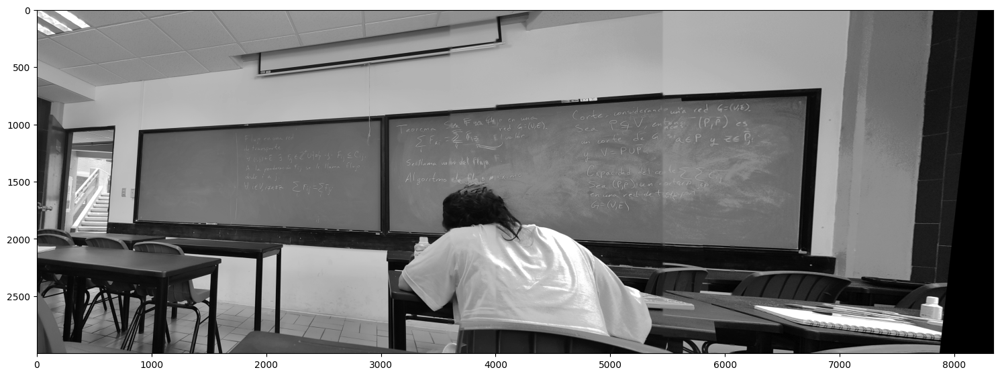

In [47]:
directory = "imagenes-prodimag/Salon"
img_text = os.listdir(directory)
imgs = [rgb2gray(ski.io.imread(os.path.join(directory,img_text[i]))) for i in range(3)]
imagen_panoramica = panoramica(imgs)

fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(imagen_panoramica,cmap="gray")
plt.tight_layout()
plt.show()

C:\Users\PC\AppData\Local\Temp\ipykernel_14072\3381174700.py:9: UserWarning: The input array is an 2Darray, wont be converted
  warnings.warn("The input array is an 2Darray, wont be converted")
C:\Users\PC\AppData\Local\Temp\ipykernel_14072\3381174700.py:19: RuntimeWarning: invalid value encountered in divide
  divided = (img_gray/inverted_gaussian)*255
C:\Users\PC\AppData\Local\Temp\ipykernel_14072\3381174700.py:26: RuntimeWarning: invalid value encountered in cast
  divided = (divided * 255).astype(np.uint8)


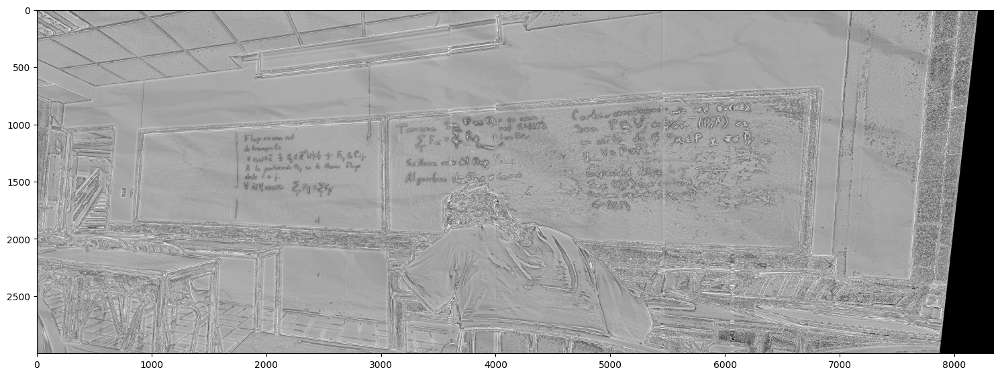

In [48]:
imagen_filtro = to_pencil(imagen_panoramica)

fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(imagen_filtro,cmap="gray")
plt.tight_layout()
plt.show()